# Prerequisites

## Install

In [1]:
# !pip install pdfminer
# !pip install conllu
# !pip install cyrtranslit
# !pip install py7zr
# !pip install --upgrade gensim
# !pip install wordcloud

## Imports

In [ ]:
from gensim.models import Word2Vec as w2v
from gensim.models.fasttext import FastText as ft
from gensim.models.doc2vec import Doc2Vec as d2v
import cyrtranslit
from conllu import parse
import pandas as pd
import numpy as np
import scipy
from matplotlib import pyplot as plt
import math, os, requests, shutil, urllib, zipfile, joblib, pickle, re, py7zr
from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfpage import PDFPage
from io import StringIO
from wordcloud import WordCloud
from sklearn.neural_network import MLPClassifier
from sklearn import preprocessing
import zipfile
import warnings
warnings.filterwarnings("ignore")

## Models and data download and extraction

In [ ]:
# os.mkdir('data')
# os.mkdir('model')

codex_path = "data/codex.pdf"
if not os.path.exists(codex_path):
    r = requests.get('http://kodekssifara.minrzs.gov.rs/documents/Sifarnik_zanimanja.pdf', stream=True)
    if r.status_code == 200:
        with open(codex_path, 'wb') as f:
            r.raw.decode_content = True
            shutil.copyfileobj(r.raw, f)

## Load Wikimorph dictionary, PoS tagger and models

In [ ]:
f = open('data/wikimorph-sr_1.0/wikimorph-sr_1.0','r+',encoding='utf-8')
wikimorph = f.read()
f.close()
morph=dict()
for wm in list(filter(None, wikimorph.split('\n'))):
    m = wm.split('\t')
    k = m[0]+'_'+'_'.join(m[2].split('_')[:2])
    v = m[1]
    if(k in morph.keys() and v not in morph[k]):
        morph[k]=morph[k]+','+v
    else:
        morph[k]=v

tagger = joblib.load('model/model.pos')

f = open('model/labels.pos', 'rb')
le = pickle.load(f)
f.close()

w2v4pos = w2v.load('model/w2v4pos.vec')

trigram_model = w2v.load('model/trigrams.vec')

## Functions and definitions

In [ ]:
female_words = ['žena', 'gospođa', 'ženski', 'devojka']
male_words = ['muškarac', 'gospodin', 'muški', 'mladić']

# https://stackoverflow.com/questions/26494211/extracting-text-from-a-pdf-file-using-pdfminer-in-python
def convert_pdf_to_txt(path):
    rsrcmgr = PDFResourceManager()
    retstr = StringIO()
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, laparams=laparams)
    fp = open(path, 'rb')
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    password = ""
    maxpages = 0
    caching = True
    pagenos=set()

    for page in PDFPage.get_pages(fp, pagenos, maxpages=maxpages, password=password,caching=caching, check_extractable=True):
        interpreter.process_page(page)

    text = retstr.getvalue()

    fp.close()
    device.close()
    retstr.close()
    return text

# longest common prefix algorithm
def are_same_root(f, m): 
    l1 = len(f) 
    l2 = len(m) 
      
    result = "" 
    
    j = 0
    i = 0
    while(i <= l1 - 1 and j <= l2 - 1): 
        if (m[i] != f[j]): 
            break
        result += f[i] 
          
        i += 1
        j += 1
  
    return len(result) > 0.8 * min(len(m),len(f))

def word_cloud(stats, by, towards, treshold):
    discrimination = stats[stats[by] - stats[towards] >= treshold]
    d = {}
    for index, row in discrimination.iterrows():
        d[row['job']] = row[by] - row[towards]
    plot_word_cloud(d)

def plot_word_cloud(dictionary):
    wordcloud = WordCloud(width=1800,height=1000, max_words=1000,relative_scaling=1,
                          normalize_plurals=False).generate_from_frequencies(dictionary)
    plt.figure(figsize = (30,15))
    plt.imshow(wordcloud, interpolation='bilinear', aspect='auto')
    plt.axis('off')

def plot_differences(stats, by, towards, title):
    discrimination = stats[stats[by] > stats[towards]]
    plt.figure(figsize=(12,5))
    plt.title(title)
    diffs = discrimination[by]-discrimination[towards]
    plt.hist(diffs, edgecolor='k', alpha=0.65)
    percentile = np.percentile(diffs, 50)
    plt.axvline(percentile, color='orange', linestyle='dashed', linewidth=2)
    min_ylim, max_ylim = plt.ylim()
    plt.text(percentile*1.05, max_ylim*0.95, 'Threshold: {:.4f}'.format(percentile))
    plt.text(percentile*1.05, max_ylim*0.9, 'Jobs: {}'.format(sum(diffs>=percentile)))
    return percentile

def calc_score(words, gender_words, model, norm, doc):
    vec = model.wv[words[0]]
    if norm:
        vec = vec / np.linalg.norm(vec)
        for i in range(1, len(words)):
            vec = vec + model.wv[words[i]]/np.linalg.norm(model.wv[words[i]])
    g_scores=list()
    for g in gender_words:
        if doc:
            vec = model.infer_vector(words)
        g_vec = model.wv[g]
        cos_sim = np.dot(vec, g_vec)/(np.linalg.norm(vec)*np.linalg.norm(g_vec))
        g_scores.append(cos_sim)
    return np.mean(g_scores)

def calc_f_score(words, model, norm=False, doc=False):
    return calc_score(words, female_words, model, norm, doc)

def calc_m_score(words, model, norm=False, doc=False):
    return calc_score(words, male_words, model, norm, doc)

nec_pos=['A_qual', 'N_com']

def lemmatize(words):
    lemmas = list()
    for word in words:
        if word in w2v4pos.wv.vocab:
            tag = le.inverse_transform(tagger.predict(w2v4pos.wv[word].reshape(1,-1)))[0]
            if word+'_'+tag in morph.keys():
                lemmas.append(morph[word+'_'+tag])
                continue
        lemmas.append(word)
    return lemmas    

# Occupations and jobs data processing

In [ ]:
text =  convert_pdf_to_txt(codex_path)
jobs =  [t.lower().split() for t in text.split('\n')]
jobs = [re.findall('\w[\u0400-\u04ff]+', ' '.join(job[1:])) for job in jobs if len(job) > 1 and '.' in job[0]]
jobs =  list(filter(None,[cyrtranslit.to_latin(' '.join(j)) for j in jobs]))

# Gender Bias in Word2Vec

## Female case

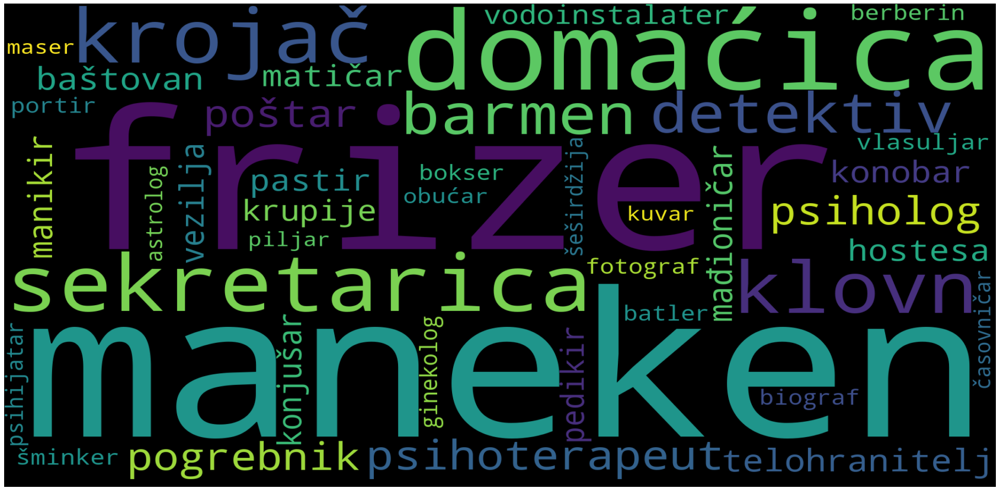

In [ ]:
# Nearest neighbouring occupations in the Word2Vec model - female case

sims_fem = [item for item in trigram_model.wv.most_similar(
    positive=female_words, topn=20000) if item[0] in jobs]

plot_word_cloud(dict(sims_fem))

## Male case

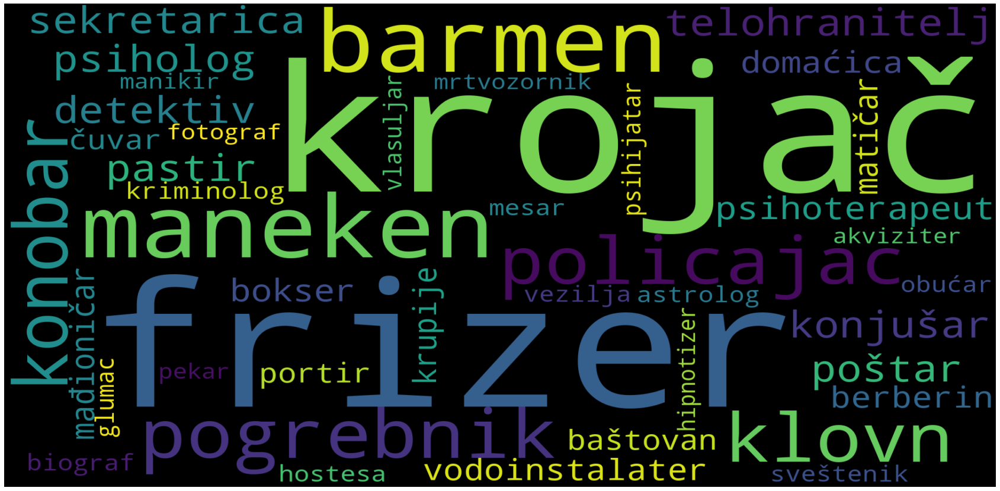

In [ ]:
# Nearest neighbouring occupations in the Word2Vec model - male case

sims_man = [item for item in trigram_model.wv.most_similar(
    positive=male_words, topn=20000) if item[0] in jobs]

plot_word_cloud(dict(sims_man))

# Gender Bias Word2Vec with the normalized sum of vectors

In [ ]:
word_model = w2v.load('model/word.vec')

statsNS = pd.DataFrame(columns=['job', 'sim2f', 'sim2m'])

already_lemmatized = list()

for i in range(len(jobs)):
    present = True
    job_parts = jobs[i].split()
    jp_lemmatized = lemmatize(job_parts)
    for j in jp_lemmatized:
        if not j in word_model.wv.vocab:
            present = False
    if not present or ' '.join(jp_lemmatized) in already_lemmatized:
        continue
    job = ' '.join(jp_lemmatized)
    already_lemmatized.append(job)
    statsNS = statsNS.append({
            'job': job, 
            'sim2f': calc_f_score(jp_lemmatized, word_model, norm=True), 
            'sim2m': calc_m_score(jp_lemmatized, word_model, norm=True)}, 
            ignore_index=True)

## Male case

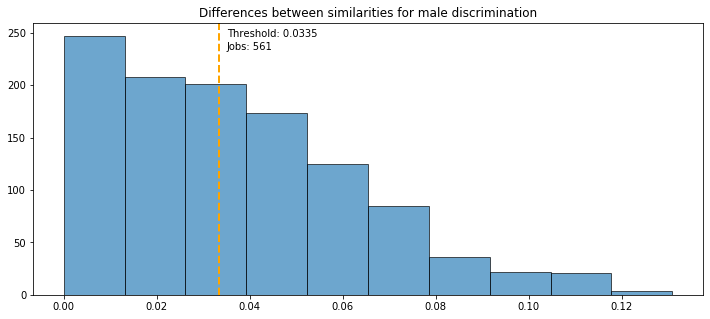

In [ ]:
# Distribution of differences between similarities

percentile = plot_differences(statsNS,'sim2m', 'sim2f', 'Differences between similarities for male discrimination')

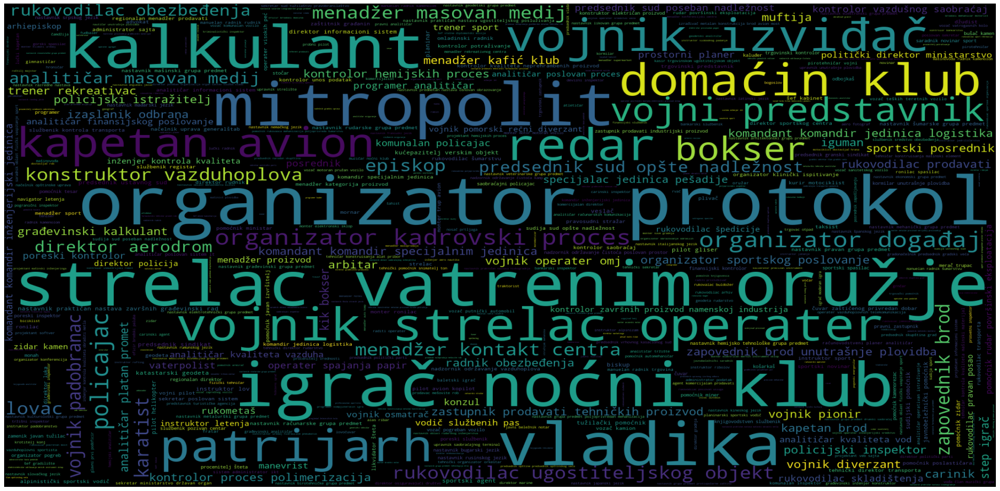

In [ ]:
# Word clouds for the most common occupations with
# tresholds for differences selected from the histogram above
word_cloud(statsNS, 'sim2m', 'sim2f', percentile)

## Female case

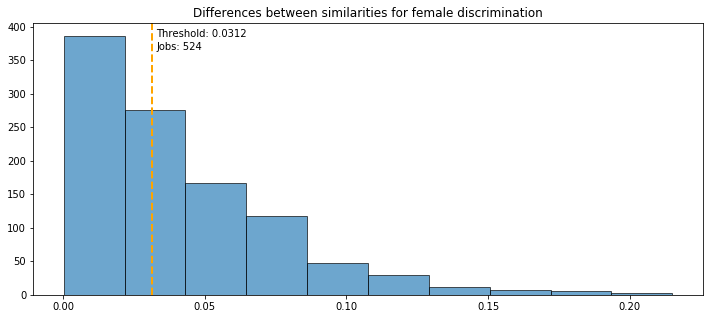

In [ ]:
percentile = plot_differences(statsNS,'sim2f', 'sim2m', 'Differences between similarities for female discrimination')

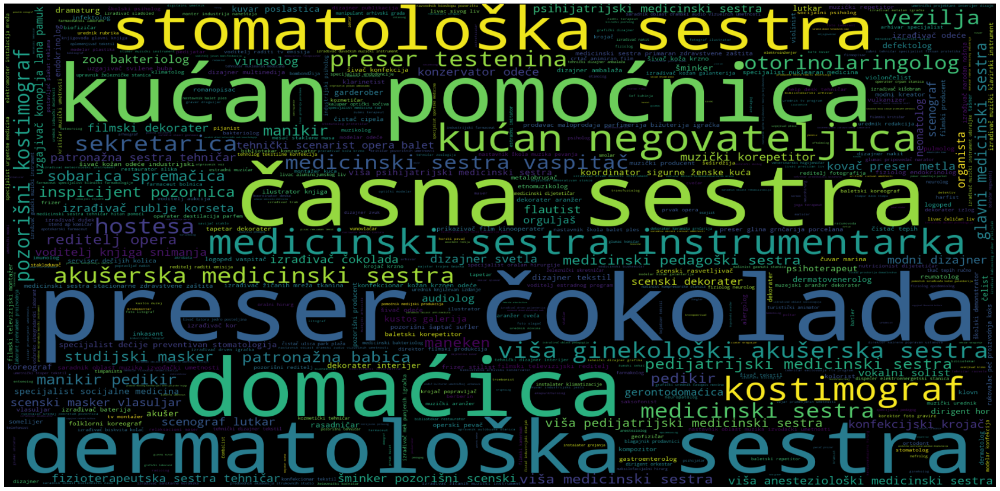

In [ ]:
word_cloud(statsNS, 'sim2f', 'sim2m', percentile)

# Gender Bias in Word2Vec with the Phraser

In [ ]:
statsW2VP = pd.DataFrame(columns=['job', 'sim2f', 'sim2m'])

already_lemmatized = list()

for i in range(len(jobs)):
    job_parts = jobs[i].split()
    jp_lemmatized = lemmatize(job_parts)
    if not jp_lemmatized or not '_'.join(jp_lemmatized) in trigram_model.wv.vocab or '_'.join(jp_lemmatized) in already_lemmatized:
        continue
    job = '_'.join(jp_lemmatized)
    already_lemmatized.append(job)                                    
    statsW2VP = statsW2VP.append({
            'job': ' '.join(job.split('_')), 
            'sim2f': calc_f_score([job], trigram_model), 
            'sim2m': calc_m_score([job], trigram_model)}, ignore_index=True)

## Male case

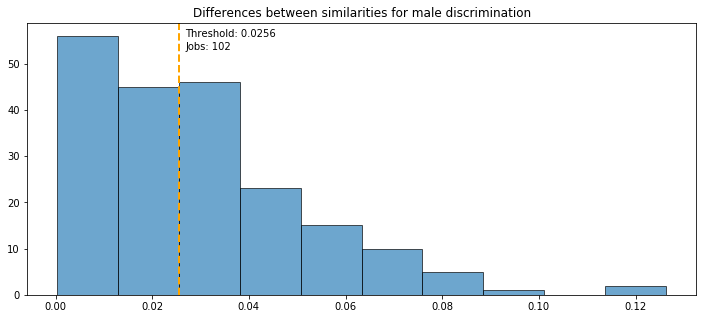

In [ ]:
percentile = plot_differences(statsW2VP,'sim2m', 'sim2f', 'Differences between similarities for male discrimination')

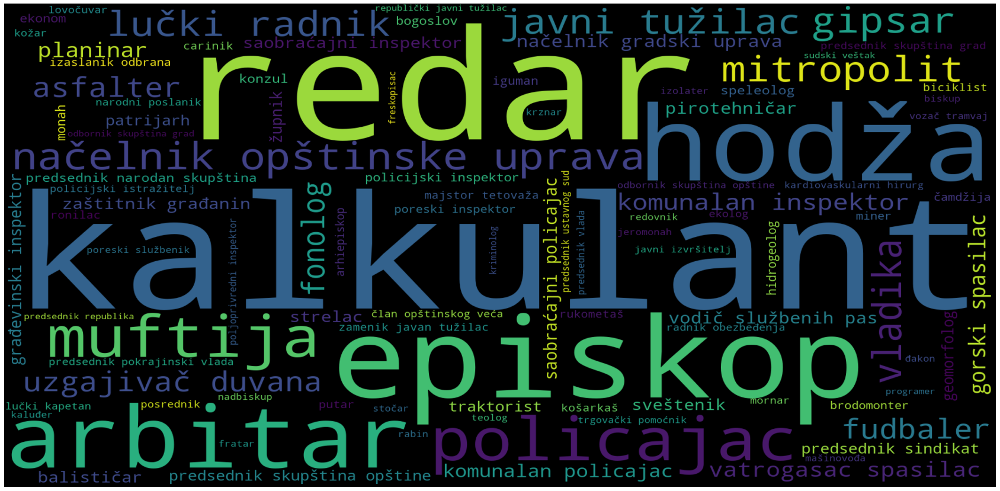

In [ ]:
word_cloud(statsW2VP, 'sim2m', 'sim2f', percentile)

## Female case

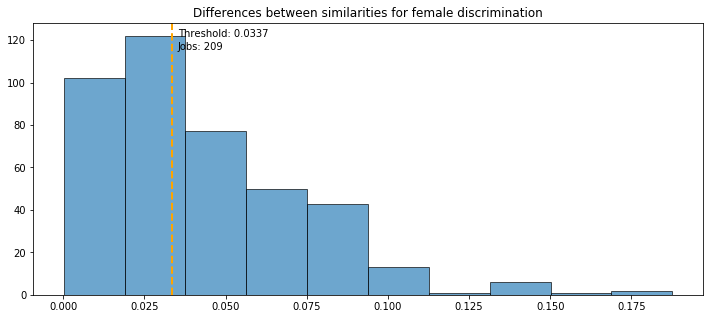

In [ ]:
percentile = plot_differences(statsW2VP,'sim2f', 'sim2m', 'Differences between similarities for female discrimination')

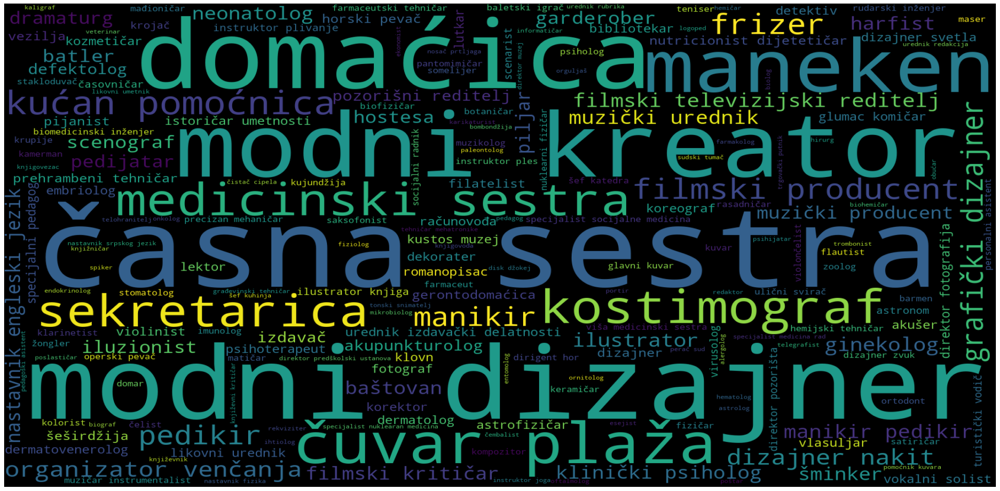

In [ ]:
word_cloud(statsW2VP, 'sim2f', 'sim2m', percentile)

# Gender Bias in FastText

In [ ]:
ft_model = ft.load('model/fasttext.vec')

statsFT = pd.DataFrame(columns=['job', 'sim2f', 'sim2m'])

already_lemmatized = list()

for i in range(0, len(jobs)):
    job_parts = jobs[i].split()
    jp_lemmatized = lemmatize(job_parts)
    if ' '.join(jp_lemmatized) in already_lemmatized:
        continue
    job = ' '.join(jp_lemmatized)
    already_lemmatized.append(job)  
    statsFT = statsFT.append({
          'job': job, 
          'sim2f': calc_f_score([job], ft_model), 
          'sim2m': calc_m_score([job], ft_model)}, ignore_index=True)  

## Male case

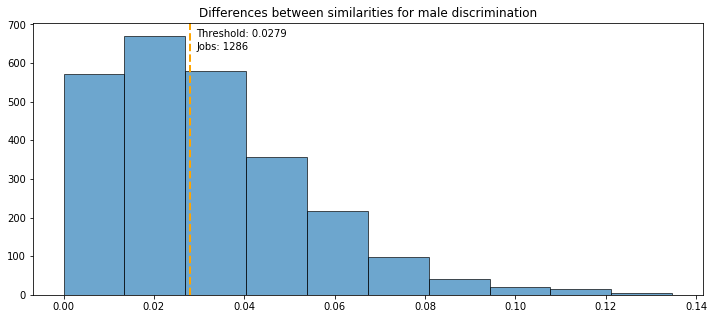

In [ ]:
percentile = plot_differences(statsFT,'sim2m', 'sim2f', 'Differences between similarities for male discrimination')

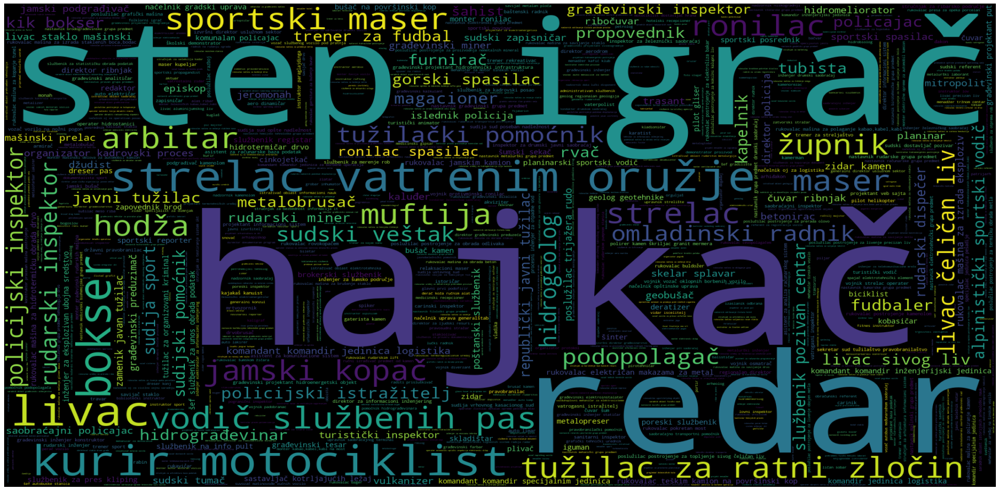

In [ ]:
word_cloud(statsFT, 'sim2m', 'sim2f', percentile)

## Female case

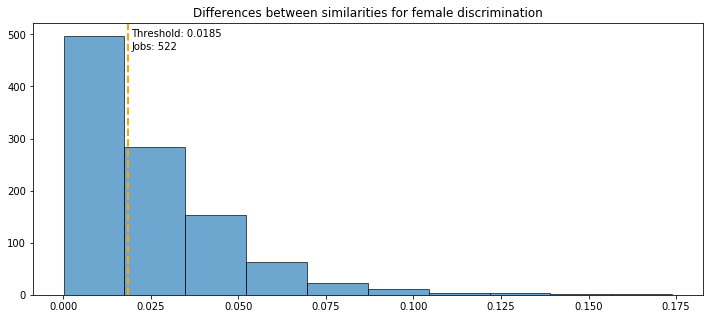

In [ ]:
percentile = plot_differences(statsFT,'sim2f', 'sim2m', 'Differences between similarities for female discrimination')

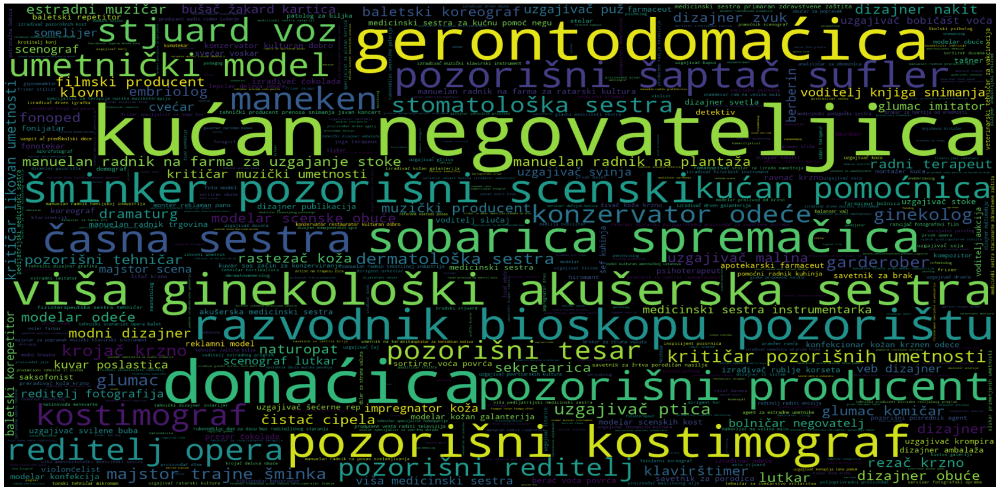

In [ ]:
word_cloud(statsFT, 'sim2f', 'sim2m', percentile)

# Gender Bias in Doc2Vec

In [ ]:
d2v_model = d2v.load('model/doc2vec.model')

statsD2V = pd.DataFrame(columns=['job', 'sim2f', 'sim2m'])

already_lemmatized = list()

for i in range(0, len(jobs)):
    present = True
    job_parts = jobs[i].split()
    jp_lemmatized = lemmatize(job_parts)
    for j in jp_lemmatized:
        if not j in d2v_model.wv.vocab:
            present = False
    if not present or ' '.join(jp_lemmatized) in already_lemmatized:
          continue
    job = ' '.join(jp_lemmatized)
    already_lemmatized.append(job)  
    statsD2V = statsD2V.append({
          'job': job, 
          'sim2f': calc_f_score(jp_lemmatized, d2v_model, doc=True), 
          'sim2m': calc_m_score(jp_lemmatized, d2v_model, doc=True)}, ignore_index=True)  

## Male case

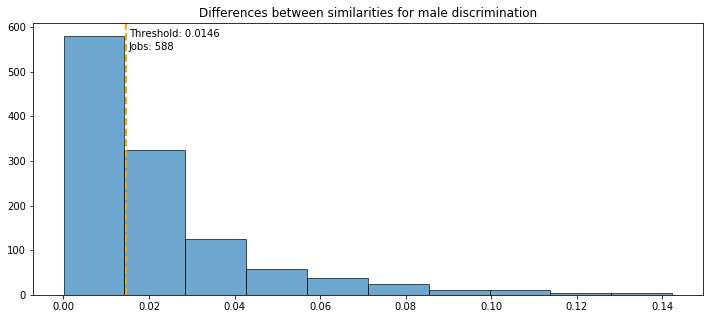

In [ ]:
percentile = plot_differences(statsD2V,'sim2m', 'sim2f', 'Differences between similarities for male discrimination')

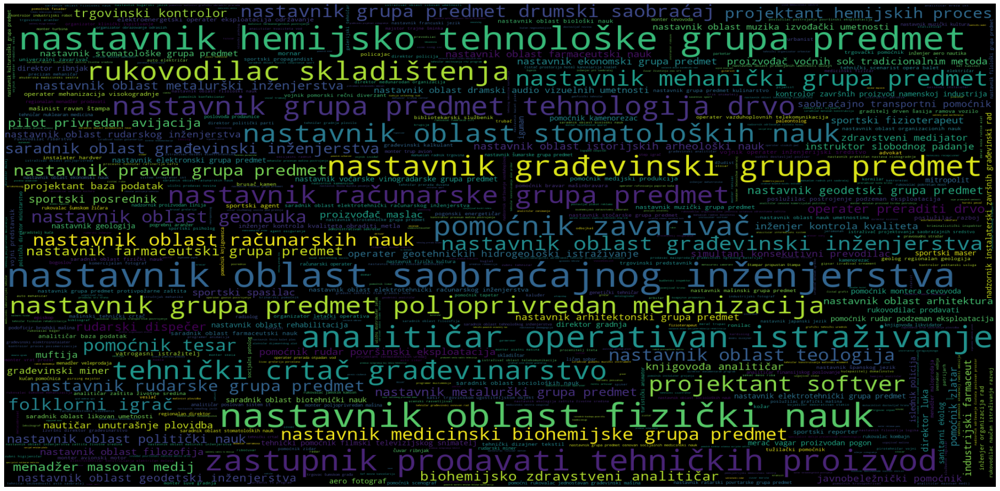

In [ ]:
word_cloud(statsD2V, 'sim2m', 'sim2f', percentile)

## Female case

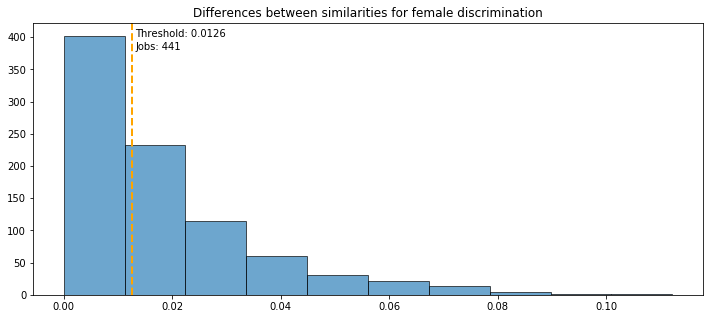

In [ ]:
percentile = plot_differences(statsD2V,'sim2f', 'sim2m', 'Differences between similarities for female discrimination')

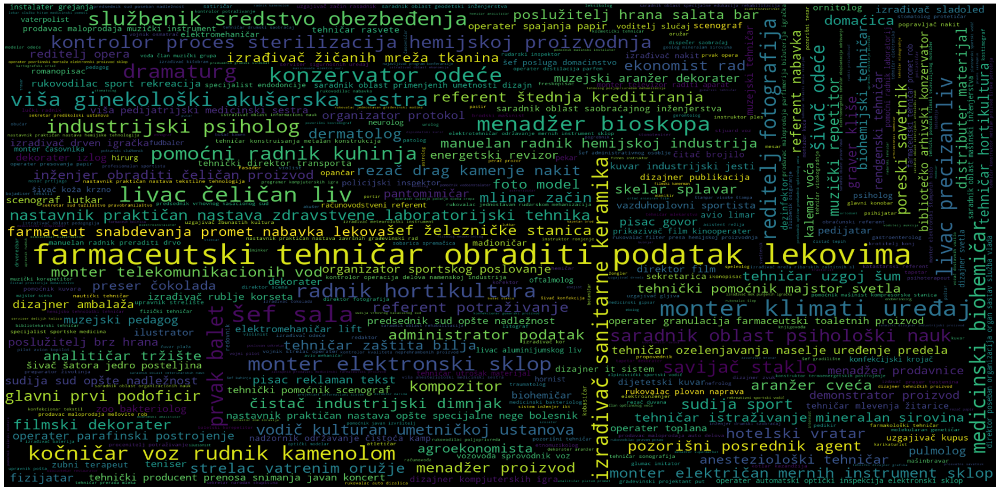

In [ ]:
word_cloud(statsD2V, 'sim2f', 'sim2m', percentile)